# Projeto #1 - Análise Exploratória de Dados

Antes de começar, leia as [Instruções](https://github.com/thvmm/pos-ds-ia/tree/master/projeto_1#instru%C3%A7%C3%B5es) e os [Critérios de Avaliação](https://github.com/thvmm/pos-ds-ia/tree/master/projeto_1#crit%C3%A9rios-de-avalia%C3%A7%C3%A3o)


### 1) **(5%)** Qual a base escolhida e qual seu interesse nela?

*Indique o link da base no Kaggle e explique em um parágrafo curto por que essa base é interessante para você.*


*Indique o link da base no Kaggle e explique em um parágrafo curto por que essa base é interessante para você.*

A base de dados selecionada para esse trabalho provêm da [perfilagem geofísica] (https://en.wikipedia.org/wiki/Well_logging) de poços de exploração mineral (fase de pesquisa). No contexto da mineração, os dados de perfilagem geofísica compõe, junto com a descrição geológica e análise geoquímica, a melhor forma de estudarmos e entendermos como a Terra está organizada em subsuperfície e, consequentemente, como os recursos minerais podem ser explorados de forma sustentável.

Como os dados são de propriedade da Vale S.A. informações sensíveis como localização e nome do poço foram suprimidas do dataset.

### 2) **(5%)** Descrição básica do conjunto de dados escolhido pelo aluno (1 parágrafo).
- Identificação da variável a serem trabalhadas
- Classificação das variáveis como: contínua ou discreta.


*Descrição da base e suas variáveis*

Mnemonic|Unit|Description|Variable Class
:--------:|:----:|:-----------|:---
DEPT|M|Logged depth|Continuous
CADE|MM|Caliper from DD3|Continuous
BIT| MM|Bit size|Discrete
GRC1|GAPI|Gamma Ray from GC1-GC2|Continuous
DD3L|CPS|Long Spaced Density Raw|Continuous
DD3B|CPS|Short Spaced Density Raw|Continuous
DENL|G/C3|Density Long Spaced|Continuous
DENB|G/C3|Density Short Spaced|Continuous
GRDE|API|Gamma Ray from DD3|Continuous
CCO1|MM|3-Arm Caliper CO1-GC2|Continuous
CO1C|CPS|Caliper Raw|Continuous
DD3G|CPS|Gamma Ray Raw |Continuous
GC1G|CPS|Gamma Ray Raw |Continuous
DD3C|CPS|Caliper Raw|Continuous
GTMP|DEGC|Borehole Temperature|Continuous
CCLF|CPS|Casing Collar Locator|Continuous
MSUS|SI|Magnetic Susceptbility|Continuous

### 3) **(15%)** Faça uma avaliação descritiva da sua base. Quantas linhas ela possui? Quais os tipos de dados? Quantas e quais features possuem?

Cada variável escolhida pelo aluno precisa passar por ao menos 1 pré-processamento. O pré-processamento pode ser (mas não está limitado a):
- Checagem se os valores estão dentro de um limite permitido ou razoável.
- Tratamento de valores ausentes por eliminação ou substituição.
- Conversão do tipo de dados.


In [ ]:
# Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.

In [2]:
#importação dos pacotes
import os
import lasio
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing

# caminho para o dataset

log_path = r'/Volumes/GoogleDrive/My Drive/Academico/UniBH-AI and DataScience/Git/projetos/aed_projeto_1/log.las'  



In [3]:
#leitura do las e conversão para dataframe
log = lasio.read(log_path)
df_log = log.df()

print(type(df_log))

#breve visualização do dataframe
df_log

<class 'pandas.core.frame.DataFrame'>


,CADE,BIT,GRC1,DD3L,DD3B,DENL,DENB,GRDE,CCO1,CO1C,DD3G,GC1G,DD3C,GTMP,CCLF,MSUS
DEPT,,,,,,,,,,,,,,,,
0.00,110.538,102.0,17.906,28.0,NaN,3.053,NaN,14.375,104.800,1809.0,6.0,8.0,2593.0,NaN,0.173,NaN
0.01,110.532,102.0,15.370,38.0,815.0,3.024,NaN,15.904,104.886,1807.0,6.0,8.0,2593.0,NaN,-1.455,NaN
0.02,110.523,102.0,16.796,41.0,801.0,2.995,NaN,14.222,104.746,1803.0,12.0,16.0,2589.0,NaN,-3.082,NaN
0.03,110.492,102.0,15.370,37.0,788.0,2.969,3.418,14.069,104.757,1808.0,18.0,8.0,2594.0,NaN,-4.200,NaN
0.04,110.528,102.0,14.103,33.0,761.0,2.944,3.435,13.151,104.745,1805.0,12.0,8.0,2595.0,NaN,-4.427,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554.96,101.143,102.0,57.045,18.0,1085.0,3.268,2.945,52.911,45.943,1437.0,28.0,12.0,2440.0,22.256,-0.045,1057.394
554.97,101.060,102.0,57.203,37.0,1084.0,3.267,2.950,49.852,45.950,1431.0,9.0,36.0,2447.0,22.247,-0.255,1058.822
554.98,101.061,102.0,51.499,18.0,1161.0,3.281,2.941,49.852,45.964,1428.0,28.0,12.0,2430.0,22.249,-0.309,1057.395


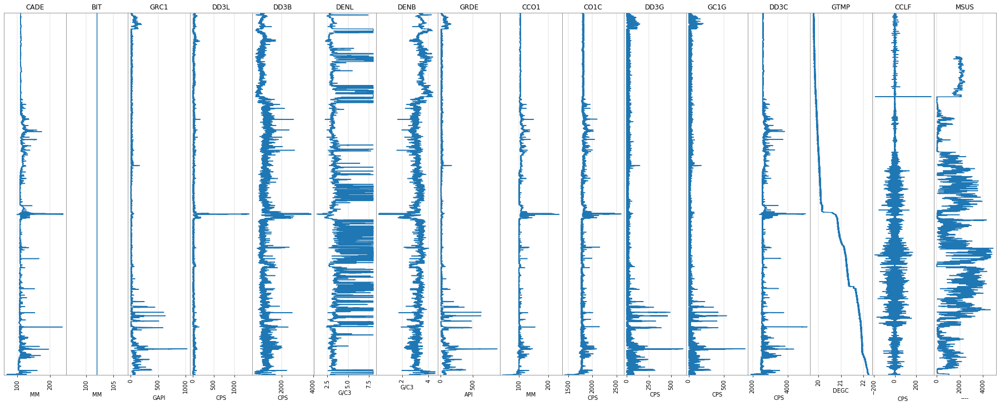

In [22]:
#plot dos logs em profundidade para visualização das séries de cada features

from welly import Well
w = Well.from_las('/Volumes/GoogleDrive/My Drive/Academico/UniBH-AI and DataScience/Git/projetos/aed_projeto_1/log.las')
w.plot()

In [4]:
#dimensões do dataset
df_log.shape

(55501, 16)

In [5]:
#descrição dos tipos de dados das features
df_log.dtypes

CADE    float64
BIT     float64
GRC1    float64
DD3L    float64
DD3B    float64
DENL    float64
DENB    float64
GRDE    float64
CCO1    float64
CO1C    float64
DD3G    float64
GC1G    float64
DD3C    float64
GTMP    float64
CCLF    float64
MSUS    float64
dtype: object

In [6]:
#check se os valores estão dentro dos limites razoáveis
df_log.describe().T

,count,mean,std,min,25%,50%,75%,max
CADE,55501.0,111.357408,7.154114,68.489,108.493,110.040,111.449,239.117
BIT,55501.0,102.000000,0.000000,102.000,102.000,102.000,102.000,102.000
GRC1,55501.0,26.602441,52.398660,0.000,6.180,12.201,20.916,1032.824
DD3L,55501.0,25.599701,42.280138,0.000,10.000,20.000,29.000,1355.000
DD3B,55500.0,913.669712,278.476003,305.000,749.000,872.000,1026.000,3872.000
DENL,55501.0,4.022631,1.628625,1.255,3.074,3.339,3.926,8.000
DENB,55498.0,3.260385,0.356103,0.239,3.068,3.273,3.465,4.513
GRDE,55501.0,25.076597,50.103453,0.000,6.117,10.705,19.115,880.522
CCO1,55501.0,104.237110,6.624384,45.838,100.818,104.004,105.491,236.297
CO1C,55501.0,1801.085440,41.596195,1424.000,1781.000,1797.000,1811.000,2599.000


In [7]:
#percentual de elementos nulos
round(df_log.isnull().mean()*100,2)

CADE     0.00
BIT      0.00
GRC1     0.00
DD3L     0.00
DD3B     0.00
DENL     0.00
DENB     0.01
GRDE     0.00
CCO1     0.00
CO1C     0.00
DD3G     0.00
GC1G     0.00
DD3C     0.00
GTMP     0.04
CCLF     0.00
MSUS    12.06
dtype: float64

In [8]:
#substituindo os valores nulos pela mediana
df_log= df_log.fillna(df_log.median())
round(df_log.isnull().mean()*100,2)

CADE    0.0
BIT     0.0
GRC1    0.0
DD3L    0.0
DD3B    0.0
DENL    0.0
DENB    0.0
GRDE    0.0
CCO1    0.0
CO1C    0.0
DD3G    0.0
GC1G    0.0
DD3C    0.0
GTMP    0.0
CCLF    0.0
MSUS    0.0
dtype: float64

In [9]:
#reescalando as features
np_log = df_log.values.astype(float)
minmax = preprocessing.MinMaxScaler()
np_log_scaled = minmax.fit_transform(np_log)

#convertendo array para dataframe

df_log_norm = pd.DataFrame(np_log_scaled)
df_log_norm

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.246437,0.0,0.017337,0.020664,0.158957,0.266568,0.709874,0.016326,0.309578,0.327660,0.009419,0.009926,0.215980,0.137849,0.355954,0.253169
1,0.246402,0.0,0.014882,0.028044,0.142977,0.262268,0.709874,0.018062,0.310030,0.325957,0.009419,0.009926,0.215980,0.137849,0.352892,0.253169
2,0.246349,0.0,0.016262,0.030258,0.139052,0.257969,0.709874,0.016152,0.309295,0.322553,0.018838,0.019851,0.214732,0.137849,0.349831,0.253169
3,0.246167,0.0,0.014882,0.027306,0.135408,0.254114,0.743800,0.015978,0.309353,0.326809,0.028257,0.009926,0.216292,0.137849,0.347728,0.253169
4,0.246378,0.0,0.013655,0.024354,0.127839,0.250408,0.747777,0.014935,0.309290,0.324255,0.018838,0.009926,0.216604,0.137849,0.347301,0.253169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55496,0.191375,0.0,0.055232,0.013284,0.218671,0.298443,0.633131,0.060090,0.000551,0.011064,0.043956,0.014888,0.168227,0.997610,0.355544,0.214883
55497,0.190889,0.0,0.055385,0.027306,0.218391,0.298295,0.634300,0.056616,0.000588,0.005957,0.014129,0.044665,0.170412,0.994024,0.355149,0.215175
55498,0.190895,0.0,0.049862,0.013284,0.239978,0.300371,0.632195,0.056616,0.000662,0.003404,0.043956,0.014888,0.165106,0.994821,0.355048,0.214883
55499,0.191035,0.0,0.053697,0.013284,0.225399,0.301112,0.631727,0.059917,0.000000,0.008511,0.089482,0.059553,0.169788,0.996016,0.355475,0.215050


In [10]:
#renomeando as features
df_log_norm.columns = df_log.columns.values
df_log_norm

,CADE,BIT,GRC1,DD3L,DD3B,DENL,DENB,GRDE,CCO1,CO1C,DD3G,GC1G,DD3C,GTMP,CCLF,MSUS
0,0.246437,0.0,0.017337,0.020664,0.158957,0.266568,0.709874,0.016326,0.309578,0.327660,0.009419,0.009926,0.215980,0.137849,0.355954,0.253169
1,0.246402,0.0,0.014882,0.028044,0.142977,0.262268,0.709874,0.018062,0.310030,0.325957,0.009419,0.009926,0.215980,0.137849,0.352892,0.253169
2,0.246349,0.0,0.016262,0.030258,0.139052,0.257969,0.709874,0.016152,0.309295,0.322553,0.018838,0.019851,0.214732,0.137849,0.349831,0.253169
3,0.246167,0.0,0.014882,0.027306,0.135408,0.254114,0.743800,0.015978,0.309353,0.326809,0.028257,0.009926,0.216292,0.137849,0.347728,0.253169
4,0.246378,0.0,0.013655,0.024354,0.127839,0.250408,0.747777,0.014935,0.309290,0.324255,0.018838,0.009926,0.216604,0.137849,0.347301,0.253169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55496,0.191375,0.0,0.055232,0.013284,0.218671,0.298443,0.633131,0.060090,0.000551,0.011064,0.043956,0.014888,0.168227,0.997610,0.355544,0.214883
55497,0.190889,0.0,0.055385,0.027306,0.218391,0.298295,0.634300,0.056616,0.000588,0.005957,0.014129,0.044665,0.170412,0.994024,0.355149,0.215175
55498,0.190895,0.0,0.049862,0.013284,0.239978,0.300371,0.632195,0.056616,0.000662,0.003404,0.043956,0.014888,0.165106,0.994821,0.355048,0.214883
55499,0.191035,0.0,0.053697,0.013284,0.225399,0.301112,0.631727,0.059917,0.000000,0.008511,0.089482,0.059553,0.169788,0.996016,0.355475,0.215050


In [11]:
#eliminando a feature BIT (por ser connstante)
df_log_norm = df_log_norm.drop(columns = ['BIT'])
df_log_norm

,CADE,GRC1,DD3L,DD3B,DENL,DENB,GRDE,CCO1,CO1C,DD3G,GC1G,DD3C,GTMP,CCLF,MSUS
0,0.246437,0.017337,0.020664,0.158957,0.266568,0.709874,0.016326,0.309578,0.327660,0.009419,0.009926,0.215980,0.137849,0.355954,0.253169
1,0.246402,0.014882,0.028044,0.142977,0.262268,0.709874,0.018062,0.310030,0.325957,0.009419,0.009926,0.215980,0.137849,0.352892,0.253169
2,0.246349,0.016262,0.030258,0.139052,0.257969,0.709874,0.016152,0.309295,0.322553,0.018838,0.019851,0.214732,0.137849,0.349831,0.253169
3,0.246167,0.014882,0.027306,0.135408,0.254114,0.743800,0.015978,0.309353,0.326809,0.028257,0.009926,0.216292,0.137849,0.347728,0.253169
4,0.246378,0.013655,0.024354,0.127839,0.250408,0.747777,0.014935,0.309290,0.324255,0.018838,0.009926,0.216604,0.137849,0.347301,0.253169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55496,0.191375,0.055232,0.013284,0.218671,0.298443,0.633131,0.060090,0.000551,0.011064,0.043956,0.014888,0.168227,0.997610,0.355544,0.214883
55497,0.190889,0.055385,0.027306,0.218391,0.298295,0.634300,0.056616,0.000588,0.005957,0.014129,0.044665,0.170412,0.994024,0.355149,0.215175
55498,0.190895,0.049862,0.013284,0.239978,0.300371,0.632195,0.056616,0.000662,0.003404,0.043956,0.014888,0.165106,0.994821,0.355048,0.214883
55499,0.191035,0.053697,0.013284,0.225399,0.301112,0.631727,0.059917,0.000000,0.008511,0.089482,0.059553,0.169788,0.996016,0.355475,0.215050


### 4) **(60%)** Nos blocos seguintes construa análises que vão justificar suas conclusões.

#### 4.1) **(20%)** Análise 1 -  Distribuição dos valores para cada uma das variáveis
- Exemplo para variável contínua: se o conjunto de dados possui a variável "idade". Quantos % possui a idade entre 0 e 30 anos? 31 a 59? 60+?

- Exemplo para variável discreta: se o conjunto de dados possui a variável "gênero", quantos % do conjunto de dados é do sexo feminino, quantos % é masculino? Inclua outros gêneros se houver.


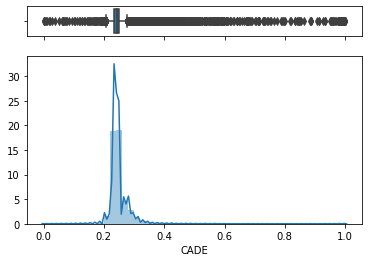

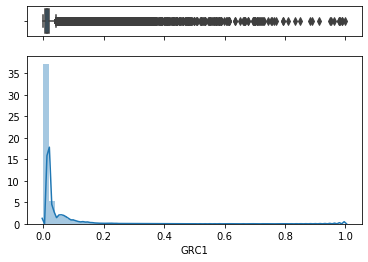

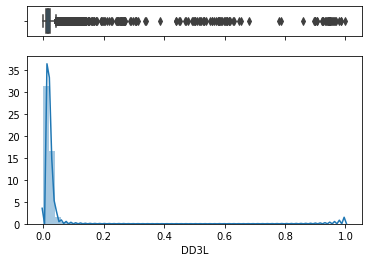

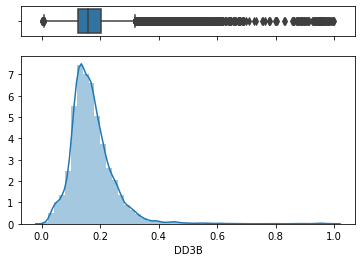

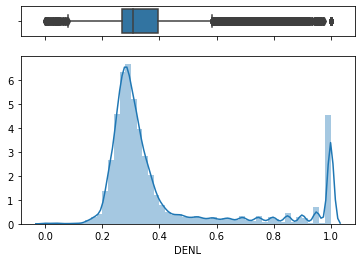

...

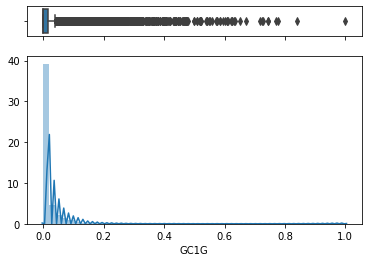

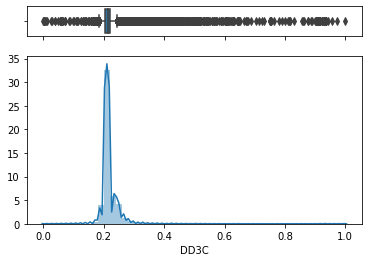

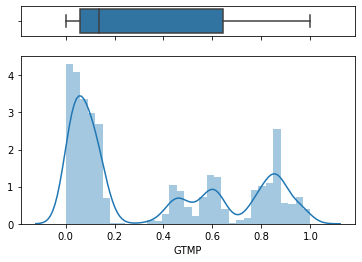

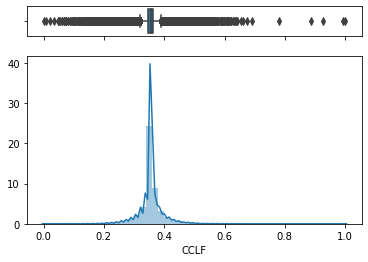

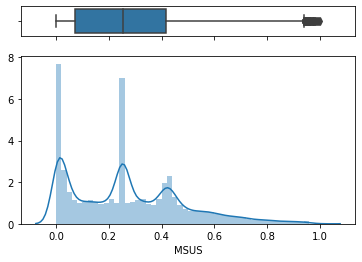

In [13]:
# Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.

# plot da distribuição e boxplot de cada feature

for feature in df_log_norm.columns.values:    
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios":(0.15, 0.85)})
    sns.boxplot(df_log_norm[feature], ax=ax_box)
    sns.distplot(df_log_norm[feature], ax=ax_hist)
    ax_box.set(xlabel='')   #remover label do eixo x no boxplot
    plt.show()

#### 4.2) **(20%)** Análise 2 - Dependência entre variáveis
O aluno deve apresentar as mesmas distribuições para cada valor da variável dependente. Exemplo: Em um conjunto de dados em que as variáveis independentes são idade e sexo, e a variável dependente é renda. O aluno pode dividir a renda em 3 "grupos", <1000 reais, entre 1000 e 10000 reais e >1000 reais. Para cada um desses grupos, é necessário apresentar a distribuição das variáveis "idade" e "sexo".


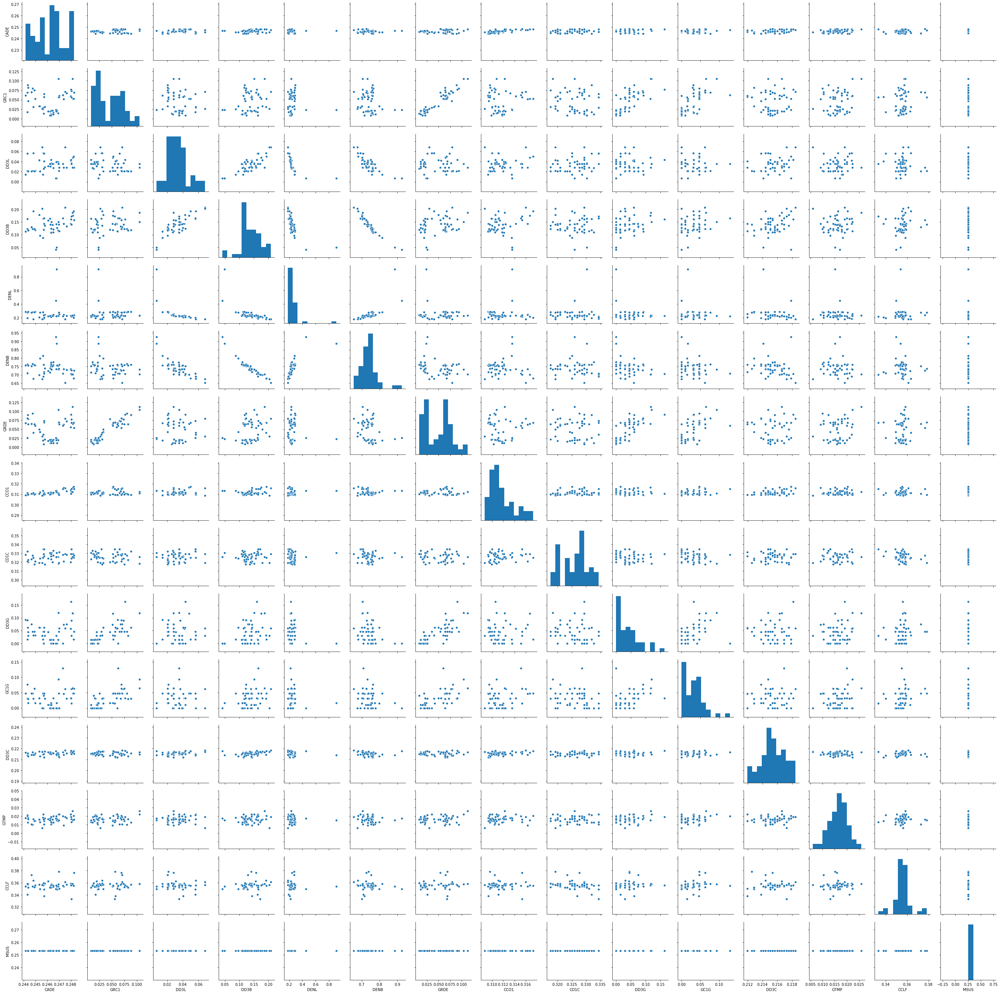

In [14]:
# Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.

#pairwise plot - subset para otimizar tempo - É utilizado a matriz de scatterplots para buscar relações de dependência entre as features,#uma vez que não há clara relação de dependência a priori. 

sample_idx = np.random.choice(1000, replace=False, size = 50)
df_log_norm_sub = df_log_norm.iloc[sample_idx]
sns.pairplot(df_log_norm_sub)

#### 4.3) **(20%)** Análise 3 - Correlação entre variáveis

O aluno deve apresentar 3 análises de correlação entre variáveis do conjunto de dados trabalhado. Exemplo: Em um conjunto de dados com as informações de temperatura e ocorrência de incêndios, eu gostaria de saber a incidência de correlação entre as duas variáveis.



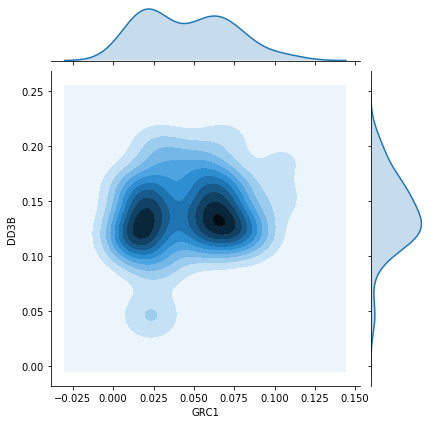

In [15]:
# Primeiro par de variáveis: Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.
sns.jointplot(x="GRC1", y="DD3B", data=df_log_norm_sub, kind="kde")

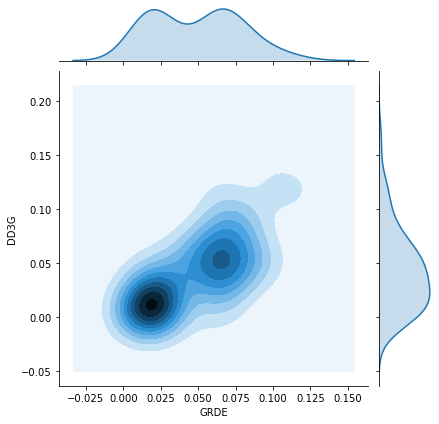

In [16]:
# Segundo par de variáveis: Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.
sns.jointplot(x="GRDE", y="DD3G", data=df_log_norm_sub, kind="kde")

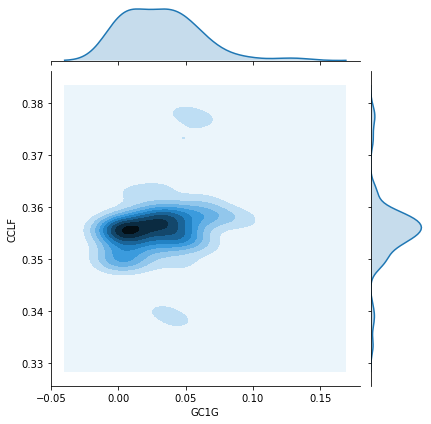

In [18]:
# Terceiro par de variáveis: Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.
sns.jointplot(x="GC1G", y="CCLF", data=df_log_norm_sub, kind="kde")

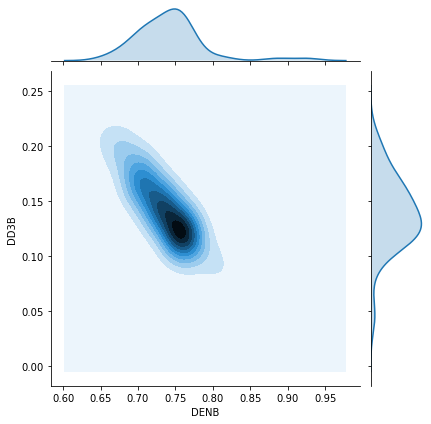

In [23]:
# Quarto par de variáveis: Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.
sns.jointplot(x="DENB", y="DD3B", data=df_log_norm_sub, kind="kde")

### 5) Conclusões **15%**

*O que é possível concluir com os dados que você analisou? Se fosse fazer uma apresentação, o que levaria como os maiores destaques e por que?*

A variaç